# Bank customer complaint classification by product using NLP

In [2]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import sklearn.feature_extraction.text as text
from sklearn import model_selection, preprocessing, linear_model, naive_bayes, metrics, svm
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

from textblob import TextBlob
from nltk.stem import PorterStemmer,SnowballStemmer
from textblob import Word
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.tokenize.toktok import ToktokTokenizer

from io import StringIO
import os
import string
import gensim
from gensim.models import Word2Vec
import itertools
import scipy
from scipy import spatial
import seaborn as sns
import matplotlib.pyplot as plt
import re
import nltk
tokenizer = ToktokTokenizer()
stopword_list = nltk.corpus.stopwords.words('english')   

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\subba\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [5]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\subba\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [6]:
df = pd.read_csv("D:/M.Tech/Sem 4/Final Project/Dataset/consumer_complaints.csv")


In [7]:
df.head()

,date_received,product,sub_product,issue,sub_issue,consumer_complaint_narrative,company_public_response,company,state,zipcode,tags,consumer_consent_provided,submitted_via,date_sent_to_company,company_response_to_consumer,timely_response,consumer_disputed?,complaint_id
0,08/30/2013,Mortgage,Other mortgage,"Loan modification,collection,foreclosure",NaN,NaN,NaN,U.S. Bancorp,CA,95993,NaN,NaN,Referral,09/03/2013,Closed with explanation,Yes,Yes,511074
1,08/30/2013,Mortgage,Other mortgage,"Loan servicing, payments, escrow account",NaN,NaN,NaN,Wells Fargo & Company,CA,91104,NaN,NaN,Referral,09/03/2013,Closed with explanation,Yes,Yes,511080
2,08/30/2013,Credit reporting,NaN,Incorrect information on credit report,Account status,NaN,NaN,Wells Fargo & Company,NY,11764,NaN,NaN,Postal mail,09/18/2013,Closed with explanation,Yes,No,510473
3,08/30/2013,Student loan,Non-federal student loan,Repaying your loan,Repaying your loan,NaN,NaN,"Navient Solutions, Inc.",MD,21402,NaN,NaN,Email,08/30/2013,Closed with explanation,Yes,Yes,510326
4,08/30/2013,Debt collection,Credit card,False statements or representation,Attempted to collect wrong amount,NaN,NaN,Resurgent Capital Services L.P.,GA,30106,NaN,NaN,Web,08/30/2013,Closed with explanation,Yes,Yes,511067


In [8]:
df.dtypes

date_received                   object
product                         object
sub_product                     object
issue                           object
sub_issue                       object
consumer_complaint_narrative    object
company_public_response         object
company                         object
state                           object
zipcode                         object
tags                            object
consumer_consent_provided       object
submitted_via                   object
date_sent_to_company            object
company_response_to_consumer    object
timely_response                 object
consumer_disputed?              object
complaint_id                     int64
dtype: object

In [9]:
df.describe(include='all')

,date_received,product,sub_product,issue,sub_issue,consumer_complaint_narrative,company_public_response,company,state,zipcode,tags,consumer_consent_provided,submitted_via,date_sent_to_company,company_response_to_consumer,timely_response,consumer_disputed?,complaint_id
count,555957,555957,397635,555957,212622,66806,85124,555957,551070,551452,77959,123458,555957,555957,555957,555957,555957,5.559570e+05
unique,1608,11,46,95,68,65646,10,3605,62,27052,3,4,6,1557,8,2,2,NaN
top,08/27/2015,Mortgage,Other mortgage,"Loan modification,collection,foreclosure",Account status,This company continues to report on my credit ...,Company chooses not to provide a public response,Bank of America,CA,300XX,Older American,Consent provided,Web,11/13/2015,Closed with explanation,Yes,No,NaN
freq,963,186475,74319,97191,26798,37,52478,55998,81700,1205,45257,66807,361338,1108,404293,541909,443823,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.600510e+05
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.504296e+05
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000e+00
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.863230e+05
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.737830e+05
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.441702e+06


In [10]:
df.isnull().sum()/df.shape[0]*100

date_received                    0.000000
product                          0.000000
sub_product                     28.477382
issue                            0.000000
sub_issue                       61.755675
consumer_complaint_narrative    87.983603
company_public_response         84.688744
company                          0.000000
state                            0.879025
zipcode                          0.810314
tags                            85.977513
consumer_consent_provided       77.793606
submitted_via                    0.000000
date_sent_to_company             0.000000
company_response_to_consumer     0.000000
timely_response                  0.000000
consumer_disputed?               0.000000
complaint_id                     0.000000
dtype: float64

In [11]:
df1 = df[['complaint_id','date_received','product','issue','company','state','submitted_via','company_response_to_consumer','timely_response','consumer_disputed?','consumer_complaint_narrative']]

In [12]:
df1 = df1[pd.notnull(df1['consumer_complaint_narrative'])]

## Exploratory Data Analysis

disribution of complaints by product category just to check which one received more complaints

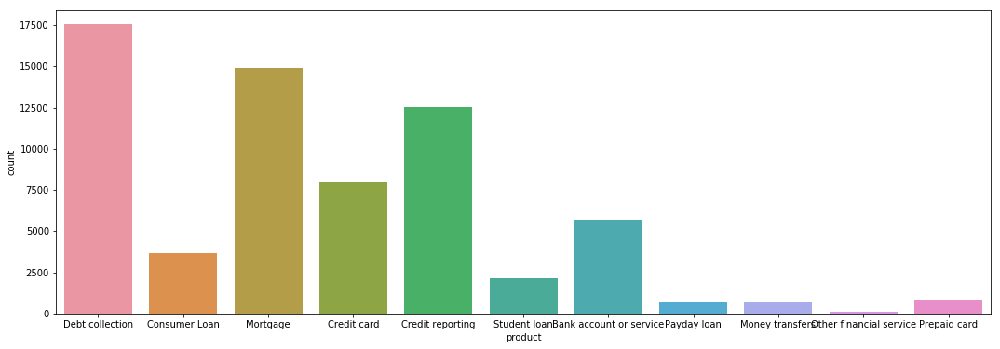

In [13]:
fig,ax = plt.subplots(figsize=(18,6))
sns.countplot(x='product',data=df1)

It is clear from plot that Debt collection category is more in number

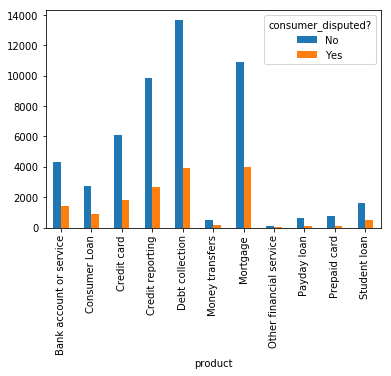

In [14]:
pd.crosstab(df1['product'],df1['consumer_disputed?']).plot(kind='bar')

Checking various plots to identify patterns within data

In [15]:
df1['date_received'] = pd.to_datetime(df1['date_received'])

In [16]:
df1.date_received.min(),df1.date_received.max()

(Timestamp('2015-03-19 00:00:00'), Timestamp('2016-04-20 00:00:00'))

In [17]:
df1['month'] = df1['date_received'].dt.month

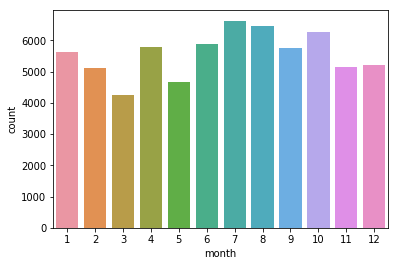

In [18]:
sns.countplot(x='month',data=df1)

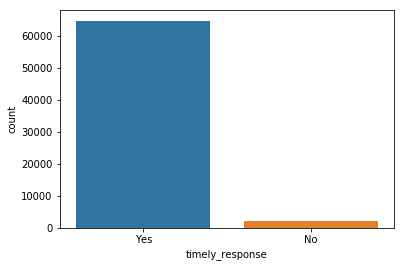

In [19]:
sns.countplot(x='timely_response',data=df1)

## Text Data Preprocessing

#### Text data to Lowercase Conversion

In [20]:
df1['consumer_complaint_narrative'] =df1['consumer_complaint_narrative'].apply(lambda x: ' '.join([i.lower() for i in x.split()]))

In [21]:
df1['consumer_complaint_narrative'].sample(2)

300848    while checking my personal credit report, i no...
290846    chase bank is using the debt collection servic...
Name: consumer_complaint_narrative, dtype: object

#### Removing Punctuations

In [22]:
df1['consumer_complaint_narrative'] =df1['consumer_complaint_narrative'].str.replace(r'[^\w\s]',"")

In [23]:
df1['consumer_complaint_narrative'].sample(2)

236461    in xxxxxxxx i contacted via letter disputes xx...
309826    xxxx xxxx xxxx this account was deleted off my...
Name: consumer_complaint_narrative, dtype: object

#### Text Data standardization

In [24]:
#Below, we used three normalizazion dictionaries from these links :
#http://www.hlt.utdallas.edu/~yangl/data/Text_Norm_Data_Release_Fei_Liu/
#http://people.eng.unimelb.edu.au/tbaldwin/etc/emnlp2012-lexnorm.tgz
#http://luululu.com/tweet/typo-corpus-r1.txt
dico = {}
dico1 = open('D:/M.Tech/Sem 4/Final Project/Project Data/doc1.txt', 'rb')
for word in dico1:
    word = word.decode('utf8')
    word = word.split()
    dico[word[1]] = word[3]
dico1.close()
dico2 = open('D:/M.Tech/Sem 4/Final Project/Project Data/doc2.txt', 'rb')
for word in dico2:
    word = word.decode('utf8')
    word = word.split()
    dico[word[0]] = word[1]
dico2.close()
dico3 = open('D:/M.Tech/Sem 4/Final Project/Project Data/doc3.txt', 'rb')
for word in dico3:
    word = word.decode('utf8')
    word = word.split()
    dico[word[0]] = word[1]
dico3.close()

In [25]:
def txt_std(words):
    list_words = words.split()
    for i in range(len(list_words)):
        if list_words[i] in dico.keys():
            list_words[i] = dico[list_words[i]]
    return ' '.join(list_words)

In [26]:
df1['consumer_complaint_narrative'] = df1['consumer_complaint_narrative'].apply(txt_std)

In [27]:
df1.consumer_complaint_narrative.head(1)

190126    xxxx has claimed i owe them 2700 for xxxx year...
Name: consumer_complaint_narrative, dtype: object

In [28]:
df1['consumer_complaint_narrative'] = df1['consumer_complaint_narrative'].str.replace(r"xx+\s","")

In [29]:
df1['consumer_complaint_narrative'].head(1)

190126    has claimed i owe them 2700 for years despite ...
Name: consumer_complaint_narrative, dtype: object

#### Removing Stopwords

In [30]:
from nltk.corpus import stopwords
stop = stopwords.words('english')
df1['consumer_complaint_narrative'] =df1['consumer_complaint_narrative'].apply(lambda x: ' '.join([i for i in x.split() if i not in stop]))

In [31]:
df1['consumer_complaint_narrative'].head(1)

190126    claimed owe 2700 years despite proof payment s...
Name: consumer_complaint_narrative, dtype: object

#### Lemmatization

In [32]:
from textblob import Word

df1['consumer_complaint_narrative'] =df1['consumer_complaint_narrative'].apply(lambda x:' '.join([Word(i).lemmatize() for i in x.split()]))

In [33]:
df1.consumer_complaint_narrative.head(1)

190126    claimed owe 2700 year despite proof payment se...
Name: consumer_complaint_narrative, dtype: object

## Word Cloud Generations for different products

Debt collection


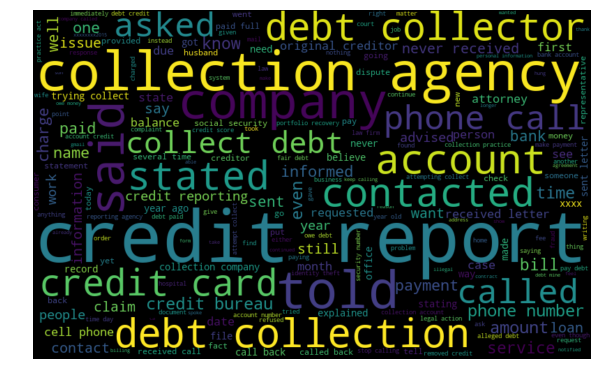

Consumer Loan


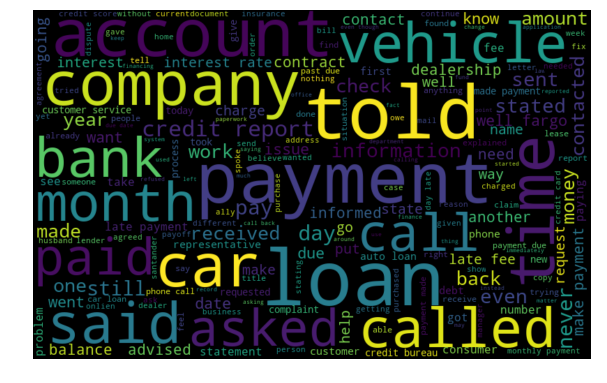

Mortgage


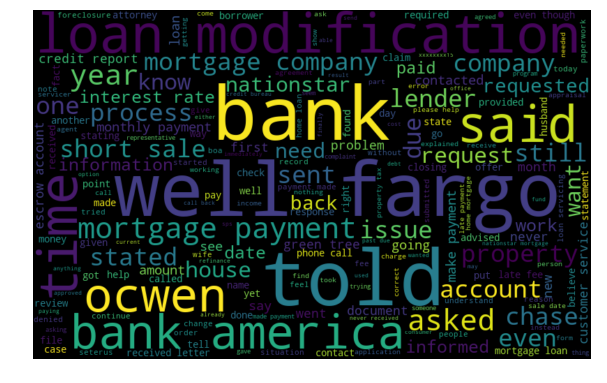

Credit card


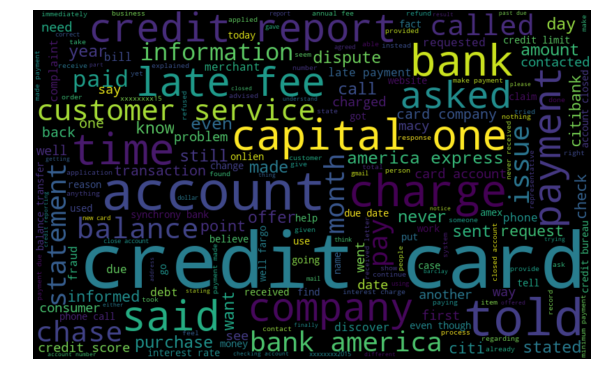

Credit reporting


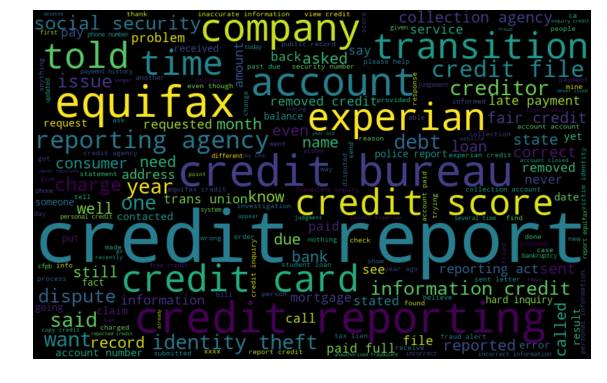

Student loan


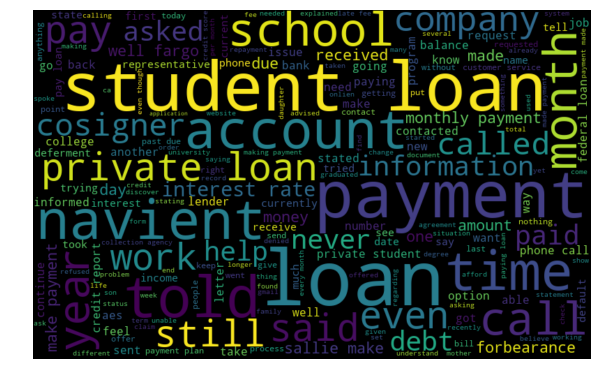

Bank account or service


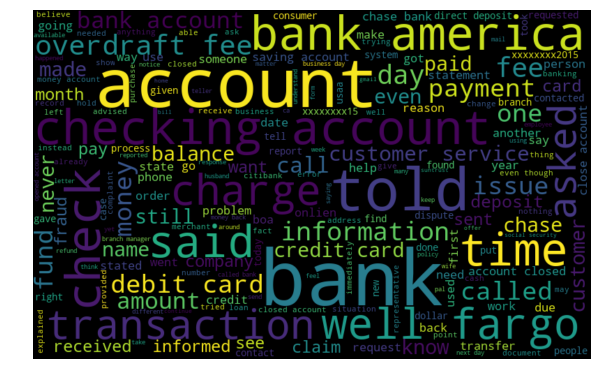

Payday loan


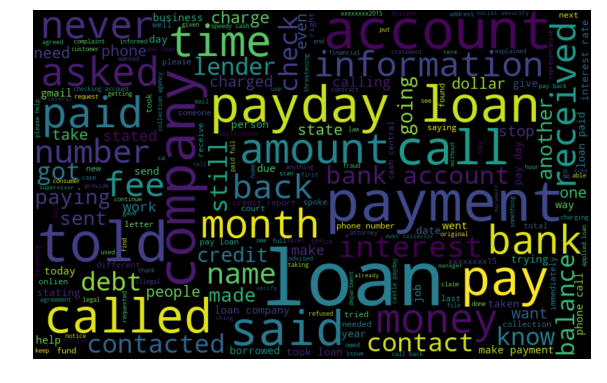

Money transfers


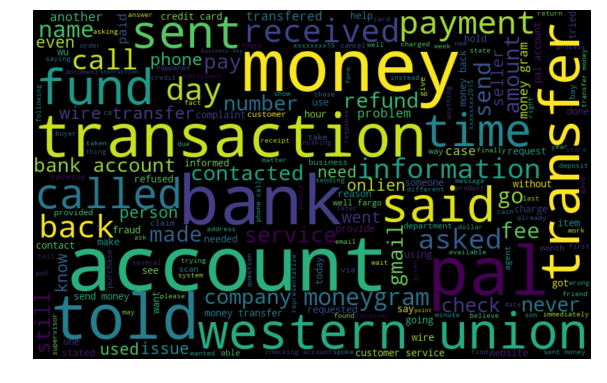

Other financial service


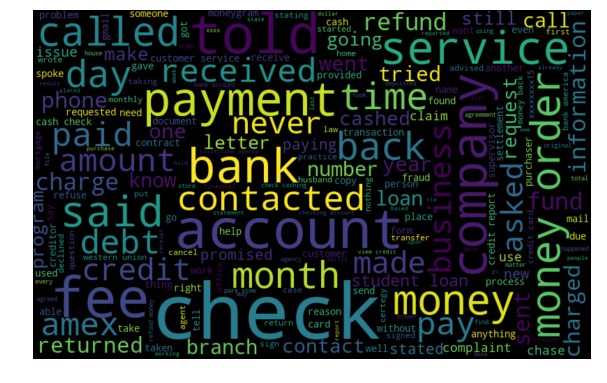

Prepaid card


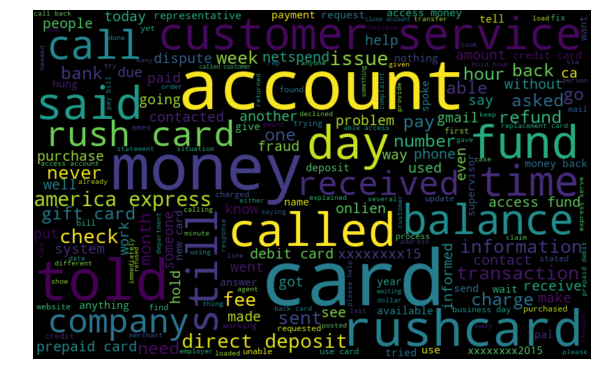

In [34]:
for product_name in df1['product'].unique():
    print(product_name)
    all_words = ' '.join([text for text in df1.loc[df1['product'].str.contains(product_name),'consumer_complaint_narrative']])
    from wordcloud import WordCloud
    wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()

## Train or Test split

In [35]:
train_x, valid_x, train_y, valid_y = train_test_split(df1['consumer_complaint_narrative'], df1['product'],stratify=df1['product'], 
                                                    test_size=0.25)

## Feature engineering of bank customer complaints using TF-IDF 

In [36]:
##label encoding target variable
enc = preprocessing.LabelEncoder()
train_y = enc.fit_transform(train_y)
valid_y = enc.fit_transform(valid_y)



In [37]:
##tf-idf verctor representation
tfidf_vect = TfidfVectorizer(analyzer='word', token_pattern=r'\w{1,}', max_features=5000)
tfidf_vect.fit(df1['consumer_complaint_narrative'])
xtrain_tfidf =  tfidf_vect.transform(train_x)
xvalid_tfidf =  tfidf_vect.transform(valid_x)

In [38]:
from sklearn.model_selection import GridSearchCV
clf = LogisticRegression()
lr_params = {'C':[int(x) for x in np.linspace(1,10,10)]}
grid_lr = GridSearchCV(estimator=clf,param_grid=lr_params,cv=5,n_jobs=-1)
grid_lr.fit(xtrain_tfidf,train_y)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'C': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [39]:
print(grid_lr.best_params_)
print(grid_lr.best_score_)

{'C': 4}
0.8470182021395497


In [40]:
final_lr = LogisticRegression(C=5)
final_lr.fit(xtrain_tfidf,train_y)

LogisticRegression(C=5, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [41]:
final_lr_predict = final_lr.predict(xvalid_tfidf)
lr_accuracy = metrics.accuracy_score(final_lr_predict, valid_y)
print ("Logistic Regression > Accuracy: ", lr_accuracy)

Logistic Regression > Accuracy:  0.8490001197461382


In [42]:
from sklearn.metrics import classification_report
print(classification_report(valid_y, final_lr_predict,target_names=df1['product'].unique()))

                         precision    recall  f1-score   support

        Debt collection       0.81      0.78      0.80      1428
          Consumer Loan       0.79      0.61      0.69       920
               Mortgage       0.81      0.82      0.81      1982
            Credit card       0.86      0.86      0.86      3132
       Credit reporting       0.82      0.89      0.85      4388
           Student loan       0.76      0.60      0.67       166
Bank account or service       0.93      0.96      0.94      3730
            Payday loan       0.00      0.00      0.00        27
        Money transfers       0.67      0.32      0.43       182
Other financial service       0.81      0.67      0.73       215
           Prepaid card       0.89      0.80      0.84       532

              micro avg       0.85      0.85      0.85     16702
              macro avg       0.74      0.66      0.69     16702
           weighted avg       0.85      0.85      0.85     16702



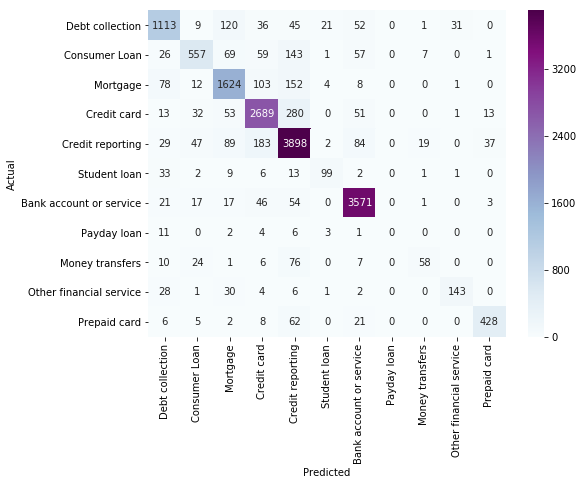

In [43]:
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(valid_y, final_lr_predict)
fig, ax = plt.subplots(figsize=(8,6))
sns.heatmap(conf_mat, annot=True, fmt="d", cmap="BuPu",xticklabels=df1['product'].unique(),yticklabels=df1['product'].unique())
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [44]:
!pip install lime

You should consider upgrading via the 'c:\users\subba\anaconda3\python.exe -m pip install --upgrade pip' command.


In [45]:
class_names=list(df1['product'].unique())

In [46]:
print(class_names)

['Debt collection', 'Consumer Loan', 'Mortgage', 'Credit card', 'Credit reporting', 'Student loan', 'Bank account or service', 'Payday loan', 'Money transfers', 'Other financial service', 'Prepaid card']


In [47]:
from lime import lime_text
from sklearn.pipeline import make_pipeline
clr = make_pipeline(tfidf_vect, final_lr)

In [48]:
print(clr.predict_proba([valid_x.iloc[1]]))

[[0.00170498 0.00820736 0.02255059 0.00410141 0.0193254  0.00304753
  0.93347275 0.00122217 0.0042405  0.00102852 0.00109879]]


In [64]:
import lime
from lime.lime_text import LimeTextExplainer

class_names=list(df1['product'].unique())
explainer = LimeTextExplainer(class_names=class_names)
idx=1
exp = explainer.explain_instance(valid_x.iloc[idx], clr.predict_proba, num_features=11, top_labels=2)

# print('Document id: %d' % idx)
# print('Predicted class =', class_names[logreg.predict(xvalid_tfidf).reshape(1,-1)[0,0]])
# print('True class: %s' % class_names[valid_y[idx]])

In [65]:
print('Document id: %d' % idx)
print('Predicted class =', class_names[final_lr.predict(xvalid_tfidf[idx]).reshape(1,-1)[0,0]])
print('True class: %s' % class_names[valid_y[idx]])

Document id: 1
Predicted class = Bank account or service
True class: Bank account or service


In [66]:
exp.show_in_notebook(text=True)

# SVM

In [67]:
from sklearn.svm import LinearSVC
svc_model = LinearSVC()
svc_params = {'C':[0.01,0.1, 1, 10, 100, 1000]}
grid_svc = GridSearchCV(estimator=svc_model,param_grid=svc_params,cv=5,n_jobs=-1)
grid_svc.fit(xtrain_tfidf,train_y)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [68]:
print(grid_svc.best_params_)
print(grid_svc.best_score_)

{'C': 0.1}
0.8445633083186971


In [69]:
final_svc = LinearSVC(C=0.1)
final_svc.fit(xtrain_tfidf,train_y)

LinearSVC(C=0.1, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)

In [70]:
final_svc_predict = final_svc.predict(xvalid_tfidf)
svc_accuracy = metrics.accuracy_score(final_svc_predict, valid_y)
print ("SVC > Accuracy: ", svc_accuracy)

SVC > Accuracy:  0.847144054604239


In [71]:
print(classification_report(valid_y, final_svc_predict,target_names=df1['product'].unique()))

                         precision    recall  f1-score   support

        Debt collection       0.81      0.79      0.80      1428
          Consumer Loan       0.81      0.56      0.66       920
               Mortgage       0.80      0.82      0.81      1982
            Credit card       0.85      0.85      0.85      3132
       Credit reporting       0.82      0.90      0.86      4388
           Student loan       0.80      0.57      0.67       166
Bank account or service       0.92      0.96      0.94      3730
            Payday loan       0.00      0.00      0.00        27
        Money transfers       0.72      0.26      0.39       182
Other financial service       0.80      0.64      0.71       215
           Prepaid card       0.88      0.80      0.84       532

              micro avg       0.85      0.85      0.85     16702
              macro avg       0.75      0.65      0.68     16702
           weighted avg       0.84      0.85      0.84     16702



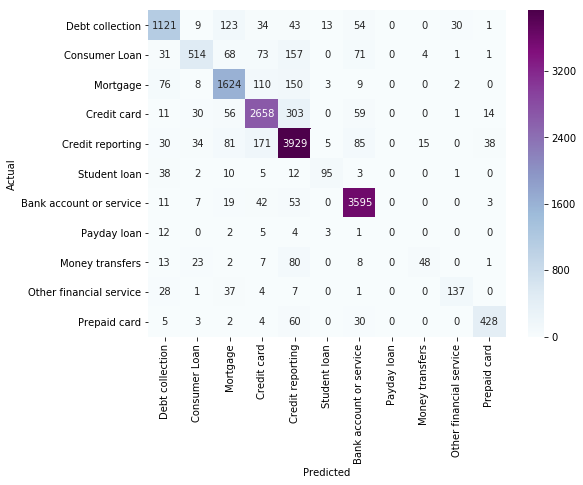

In [72]:
conf_mat = confusion_matrix(valid_y, final_svc_predict)
fig, ax = plt.subplots(figsize=(8,6))
sns.heatmap(conf_mat, annot=True, fmt="d", cmap="BuPu",xticklabels=df1['product'].unique(),yticklabels=df1['product'].unique())
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

## XGBOOST

In [73]:
from xgboost import XGBClassifier
xgb_model = XGBClassifier(max_depth=50, n_estimators=80, learning_rate=0.1, colsample_bytree=.7, gamma=0, reg_alpha=4, eta=0.3, silent=1, subsample=0.8)
xgb_model.fit(xtrain_tfidf, train_y)


XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=0.7, eta=0.3, gamma=0,
       gpu_id=-1, importance_type='gain', interaction_constraints=None,
       learning_rate=0.1, max_delta_step=0, max_depth=50,
       min_child_weight=1, missing=nan, monotone_constraints=None,
       n_estimators=80, n_jobs=0, num_parallel_tree=1,
       objective='multi:softprob', random_state=0, reg_alpha=4,
       reg_lambda=1, scale_pos_weight=None, silent=1, subsample=0.8,
       tree_method=None, validate_parameters=False, verbosity=None)

In [74]:
xgb_predict = xgb_model.predict(xvalid_tfidf)
xgb_accuracy = metrics.accuracy_score(xgb_predict, valid_y)
print ("XGBoost > Accuracy: ", xgb_accuracy)

XGBoost > Accuracy:  0.8481020237097353


In [75]:
from sklearn.metrics import classification_report
print(classification_report(valid_y, xgb_predict,target_names=df1['product'].unique()))

                         precision    recall  f1-score   support

        Debt collection       0.81      0.77      0.79      1428
          Consumer Loan       0.76      0.59      0.66       920
               Mortgage       0.81      0.80      0.80      1982
            Credit card       0.86      0.87      0.86      3132
       Credit reporting       0.83      0.89      0.86      4388
           Student loan       0.72      0.54      0.62       166
Bank account or service       0.92      0.96      0.94      3730
            Payday loan       1.00      0.04      0.07        27
        Money transfers       0.63      0.30      0.41       182
Other financial service       0.83      0.67      0.74       215
           Prepaid card       0.87      0.80      0.83       532

              micro avg       0.85      0.85      0.85     16702
              macro avg       0.82      0.66      0.69     16702
           weighted avg       0.85      0.85      0.84     16702



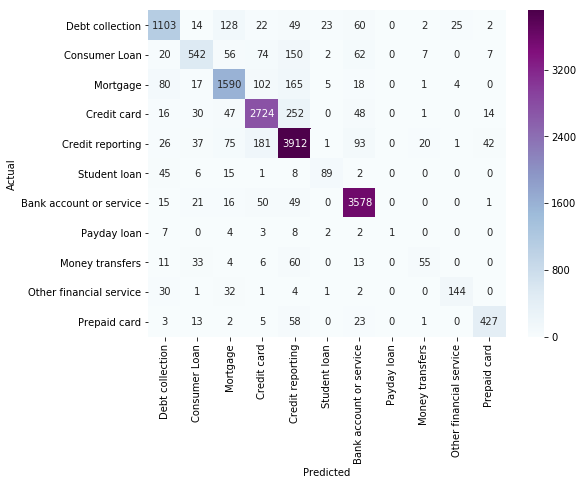

In [76]:
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(valid_y, xgb_predict)
fig, ax = plt.subplots(figsize=(8,6))
sns.heatmap(conf_mat, annot=True, fmt="d", cmap="BuPu",xticklabels=df1['product'].unique(),yticklabels=df1['product'].unique())
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [77]:
cxgb = make_pipeline(tfidf_vect, xgb_model)

In [81]:
class_names=list(df1['product'].unique())
explainer = LimeTextExplainer(class_names=class_names)
idx=97
exp = explainer.explain_instance(valid_x.iloc[idx], cxgb.predict_proba, num_features=11, top_labels=2)

In [82]:
print('Document id: %d' % idx)
print('Predicted class =', class_names[xgb_model.predict(xvalid_tfidf[idx]).reshape(1,-1)[0,0]])
print('True class: %s' % class_names[valid_y[idx]])

Document id: 97
Predicted class = Credit reporting
True class: Credit reporting


In [83]:
exp.show_in_notebook(text=True)

## Deep Learning models

In [38]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.layers import Dense, Input, LSTM, Embedding, Dropout, Activation
from keras.layers import Bidirectional, GlobalMaxPool1D, Conv1D, SimpleRNN
from keras.models import Model
from keras.models import Sequential
from keras import initializers, regularizers, constraints, optimizers, layers
from keras.layers import Dense, Input, Flatten, Dropout, BatchNormalization
from keras.layers import Conv1D, MaxPooling1D, Embedding
from keras.models import Sequential

In [39]:
total_complaints = np.append(train_x.values,valid_x.values)
tokenizer = Tokenizer(num_words=25000)
tokenizer.fit_on_texts(train_x.values)#total_complaints
train_sequences = tokenizer.texts_to_sequences(train_x.values)
test_sequences = tokenizer.texts_to_sequences(valid_x.values)

In [40]:
word_index = tokenizer.word_index# dictionary containing words and their index
print('Found %s unique tokens.' % len(word_index))

Found 50770 unique tokens.


In [41]:
MAX_SEQUENCE_LENGTH = max([len(c.split()) for c in total_complaints])

In [42]:
MAX_SEQUENCE_LENGTH

394

In [43]:
train_data = pad_sequences(train_sequences, maxlen=MAX_SEQUENCE_LENGTH,padding='post')
test_data = pad_sequences(test_sequences, maxlen=MAX_SEQUENCE_LENGTH,padding='post')

In [44]:
print(train_data.shape)
print(test_data.shape)

(50104, 394)
(16702, 394)


In [45]:
enc = preprocessing.LabelEncoder()
train_labels = enc.fit_transform(train_y)
test_labels = enc.fit_transform(valid_y)


In [46]:
print(enc.classes_)
print(np.unique(train_labels, return_counts=True))
print(np.unique(test_labels, return_counts=True))

[ 0  1  2  3  4  5  6  7  8  9 10]
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64), array([ 4283,  2758,  5947,  9394, 13164,   500, 11189,    83,   544,
         646,  1596], dtype=int64))
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64), array([1428,  920, 1982, 3132, 4388,  166, 3730,   27,  182,  215,  532],
      dtype=int64))


In [47]:
labels_train = to_categorical(np.asarray(train_labels))
labels_test = to_categorical(np.asarray(test_labels))
print('Shape of data tensor:', train_data.shape)
print('Shape of label tensor:', labels_train.shape)
print('Shape of label tensor:', labels_test.shape)

Shape of data tensor: (50104, 394)
Shape of label tensor: (50104, 11)
Shape of label tensor: (16702, 11)


## CNN w/ Pre-trained word embeddings(GloVe)

In [48]:
#wget http://nlp.stanford.edu/data/glove.6B.zip
GLOVE_DIR = 'D:/M.Tech/Sem 4/Final Project/glove.6B'
embeddings_index = {}
f = open(os.path.join(GLOVE_DIR, 'glove.6B.300d.txt'),  encoding="utf8")
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


Embedded Matrix

In [49]:
EMBEDDING_DIM = 300
embedding_matrix = np.zeros((len(word_index) + 1, EMBEDDING_DIM))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # words not found in embedding index will be all-zeros.
        embedding_matrix[i] = embedding_vector

In [50]:
[(k,v) for k,v in word_index.items() if v==4]

[('loan', 4)]

In [51]:
embedding_matrix[4]  ## word embedded vector representation for token 'loan'

array([ 0.13474999,  0.063568  , -0.37950999, -0.080729  ,  0.34176001,
       -0.0053481 ,  0.80001003, -0.78824002, -0.47262999, -0.89402002,
        0.086908  , -0.051773  ,  0.57349998, -0.26681   , -0.0043554 ,
       -0.68673003,  0.54759002, -0.47711   ,  0.12997   , -0.50748003,
        0.073666  , -0.56199998,  0.19243   , -0.022735  ,  0.15757   ,
        0.68008   , -0.48374999,  0.14399   , -0.69022   ,  0.26741001,
       -0.53082001, -0.29096001,  0.32907999,  0.12313   , -1.14779997,
       -0.51828998, -0.018956  ,  0.02077   , -0.0015803 , -0.053114  ,
       -0.10982   , -0.83578998, -0.46337   ,  0.85992002,  0.57225001,
       -0.33202001, -0.23357999,  0.80937999, -0.43586999,  0.35385001,
        0.0055405 ,  0.068909  ,  0.13897   ,  0.16237999,  0.038382  ,
       -0.16306999, -0.022701  ,  0.14324   , -0.25878   , -0.47661999,
        0.25588   , -0.23389   , -0.14936   , -0.51688999,  0.44329   ,
        0.49015   ,  0.25725001, -0.45041999,  0.66949999, -0.32

In [52]:
vocab_size = len(tokenizer.word_index)+1

In [99]:
model = Sequential()
model.add(Embedding(len(word_index) + 1,
                            EMBEDDING_DIM,
                            weights=[embedding_matrix],
                            input_length=MAX_SEQUENCE_LENGTH,
                            trainable=True))
model.add(Dropout(0.3))
model.add(Conv1D(128, 5, activation="relu"))
model.add(MaxPooling1D(5))
model.add(Dropout(0.3))
model.add(BatchNormalization())
model.add(Conv1D(128, 5, activation="relu"))
model.add(MaxPooling1D(5))
model.add(Dropout(0.3))
model.add(BatchNormalization())
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(11, activation="softmax"))
model.compile(loss='categorical_crossentropy',
 optimizer="rmsprop",
 metrics=['acc'])

In [100]:
history = model.fit(train_data, labels_train,
 batch_size=64,
 epochs=4,
 validation_data=(test_data, labels_test))

Epoch 1/4
783/783 [==============================] - 439s 559ms/step - loss: 1.3193 - acc: 0.5760 - val_loss: 0.6360 - val_acc: 0.8056
Epoch 2/4
783/783 [==============================] - 422s 539ms/step - loss: 0.6657 - acc: 0.7973 - val_loss: 0.5757 - val_acc: 0.8341
Epoch 3/4
783/783 [==============================] - 453s 578ms/step - loss: 0.5708 - acc: 0.8291 - val_loss: 0.5491 - val_acc: 0.8384
Epoch 4/4
783/783 [==============================] - 426s 544ms/step - loss: 0.5119 - acc: 0.8461 - val_loss: 0.5502 - val_acc: 0.8439


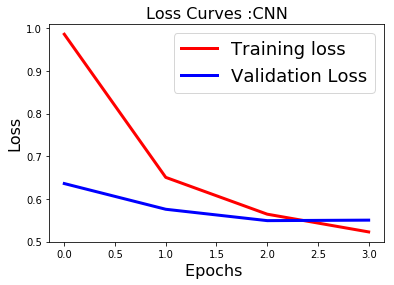

In [101]:
fig1 = plt.figure()
plt.plot(history.history['loss'],'r',linewidth=3.0)
plt.plot(history.history['val_loss'],'b',linewidth=3.0)
plt.legend(['Training loss', 'Validation Loss'],fontsize=18)
plt.xlabel('Epochs ',fontsize=16)
plt.ylabel('Loss',fontsize=16)
plt.title('Loss Curves :CNN',fontsize=16)
plt.show()

In [102]:
#predictions on test data
predicted=model.predict(test_data)
predicted

array([[2.69339307e-05, 2.49869889e-04, 1.25372142e-03, ...,
        3.93376286e-05, 2.68556359e-08, 5.53271202e-05],
       [1.86071196e-03, 4.17925185e-04, 2.80969016e-05, ...,
        9.25021084e-07, 1.17578267e-12, 5.14661025e-08],
       [1.65755464e-05, 1.91245796e-04, 1.24855607e-03, ...,
        1.53153053e-07, 3.44043335e-11, 1.32932309e-05],
       ...,
       [6.54800090e-07, 3.11685799e-05, 4.76235291e-04, ...,
        5.87171201e-07, 3.48046002e-11, 2.56748740e-06],
       [1.62100559e-03, 5.75280865e-06, 8.27587485e-07, ...,
        5.43383871e-12, 1.66603374e-17, 1.27909801e-11],
       [2.18881614e-04, 1.25374272e-03, 6.15902292e-03, ...,
        2.50709301e-04, 3.59884751e-07, 1.12444635e-04]], dtype=float32)

In [103]:
#model evaluation
import sklearn
from sklearn.metrics import precision_recall_fscore_support as score
precision, recall, fscore, support = score(labels_test, predicted.round())
print('precision: \n{}'.format(precision))
print('recall: \n{}'.format(recall))
print('fscore: \n{}'.format(fscore))
print('support: \n{}'.format(support))

precision: 
[0.82798165 0.84848485 0.85185185 0.85786164 0.8612529  0.76744186
 0.94007491 0.         0.49473684 0.74747475 0.92982456]
recall: 
[0.75840336 0.5173913  0.76589304 0.87100894 0.84594348 0.39759036
 0.94209115 0.         0.25824176 0.68837209 0.69736842]
fscore: 
[0.79166667 0.64280891 0.80658874 0.8643853  0.85352955 0.52380952
 0.94108195 0.         0.33935018 0.71670702 0.79699248]
support: 
[1428  920 1982 3132 4388  166 3730   27  182  215  532]


In [104]:
print(classification_report(labels_test, predicted.round(),target_names=df1['product'].unique()))

                         precision    recall  f1-score   support

        Debt collection       0.83      0.76      0.79      1428
          Consumer Loan       0.85      0.52      0.64       920
               Mortgage       0.85      0.77      0.81      1982
            Credit card       0.86      0.87      0.86      3132
       Credit reporting       0.86      0.85      0.85      4388
           Student loan       0.77      0.40      0.52       166
Bank account or service       0.94      0.94      0.94      3730
            Payday loan       0.00      0.00      0.00        27
        Money transfers       0.49      0.26      0.34       182
Other financial service       0.75      0.69      0.72       215
           Prepaid card       0.93      0.70      0.80       532

              micro avg       0.87      0.82      0.84     16702
              macro avg       0.74      0.61      0.66     16702
           weighted avg       0.87      0.82      0.84     16702
            samples avg

In [105]:
#The Embedding layer requires the specification of the vocabulary size (vocab_size), 
#the size of the real-valued vector space EMBEDDING_DIM = 100,
#and the maximum length of input documents max_length .
vocab_size = len(tokenizer.word_index)+1
EMBEDDING_DIM = 300
max_length = 394

In [106]:
model = Sequential()
model.add(Embedding(vocab_size,
 300,
 input_length=max_length
 ))
model.add(Dropout(0.3))
model.add(Conv1D(128, 5, activation="relu"))
model.add(MaxPooling1D(5))
model.add(Dropout(0.3))
model.add(BatchNormalization())
model.add(Conv1D(128, 5, activation="relu"))
model.add(MaxPooling1D(5))
model.add(Dropout(0.3))
model.add(BatchNormalization())
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(11, activation="softmax"))
model.compile(loss='categorical_crossentropy',
 optimizer="rmsprop",
 metrics=['acc'])

In [107]:
history = model.fit(train_data, labels_train,
 batch_size=64,
 epochs=4,
 validation_data=(test_data, labels_test))

Epoch 1/4
783/783 [==============================] - 411s 524ms/step - loss: 1.3221 - acc: 0.5677 - val_loss: 0.6107 - val_acc: 0.8238
Epoch 2/4
783/783 [==============================] - 413s 527ms/step - loss: 0.5814 - acc: 0.8284 - val_loss: 0.5445 - val_acc: 0.8430
Epoch 3/4
783/783 [==============================] - 412s 526ms/step - loss: 0.4979 - acc: 0.8507 - val_loss: 0.5872 - val_acc: 0.8385
Epoch 4/4
783/783 [==============================] - 412s 527ms/step - loss: 0.4496 - acc: 0.8664 - val_loss: 0.5863 - val_acc: 0.8410


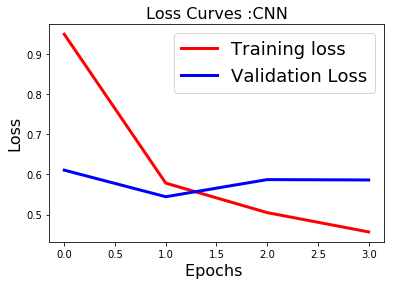

In [108]:
fig1 = plt.figure()
plt.plot(history.history['loss'],'r',linewidth=3.0)
plt.plot(history.history['val_loss'],'b',linewidth=3.0)
plt.legend(['Training loss', 'Validation Loss'],fontsize=18)
plt.xlabel('Epochs ',fontsize=16)
plt.ylabel('Loss',fontsize=16)
plt.title('Loss Curves :CNN',fontsize=16)
plt.show()

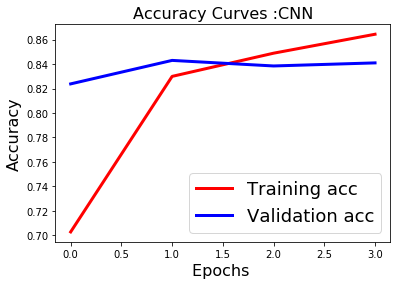

In [109]:
fig1 = plt.figure()
plt.plot(history.history['acc'],'r',linewidth=3.0)
plt.plot(history.history['val_acc'],'b',linewidth=3.0)
plt.legend(['Training acc', 'Validation acc'],fontsize=18)
plt.xlabel('Epochs ',fontsize=16)
plt.ylabel('Accuracy',fontsize=16)
plt.title('Accuracy Curves :CNN',fontsize=16)
plt.show()

In [110]:
#predictions on test data
predicted=model.predict(test_data)
predicted

array([[1.88533534e-06, 2.69501965e-04, 3.09513474e-04, ...,
        5.81123049e-06, 7.44751552e-11, 3.03142915e-05],
       [5.87241782e-04, 3.41382896e-04, 2.25206145e-06, ...,
        4.71210342e-07, 2.30891043e-16, 1.10893870e-06],
       [1.35978516e-05, 5.74742589e-05, 3.12732096e-04, ...,
        1.79359620e-08, 5.06602711e-11, 3.03043566e-06],
       ...,
       [1.68397847e-07, 1.57478662e-05, 1.82388164e-03, ...,
        6.38455733e-10, 5.86318667e-12, 1.23372805e-08],
       [4.75780553e-07, 4.17688240e-09, 6.27661464e-11, ...,
        2.07681659e-17, 1.25095379e-22, 3.20799355e-12],
       [1.49408399e-04, 9.29508591e-04, 2.63600033e-02, ...,
        3.94969493e-06, 3.12241326e-08, 1.25679999e-05]], dtype=float32)

In [111]:
#model evaluation
import sklearn
from sklearn.metrics import precision_recall_fscore_support as score
precision, recall, fscore, support = score(labels_test, predicted.round())
print('precision: {}'.format(precision))
print('recall: {}'.format(recall))
print('fscore: {}'.format(fscore))
print('support: {}'.format(support))
print("############################")
print(sklearn.metrics.classification_report(labels_test, predicted.round()))

precision: [0.7790132  0.81674566 0.8425672  0.84582177 0.86389281 0.61764706
 0.93761614 0.         0.51456311 0.78531073 0.92401961]
recall: [0.78501401 0.56195652 0.77497477 0.87579821 0.83751139 0.63253012
 0.94691689 0.         0.29120879 0.64651163 0.70864662]
fscore: [0.78200209 0.66580811 0.80735874 0.86054902 0.85049757 0.625
 0.94224356 0.         0.37192982 0.70918367 0.80212766]
support: [1428  920 1982 3132 4388  166 3730   27  182  215  532]
############################
              precision    recall  f1-score   support

           0       0.78      0.79      0.78      1428
           1       0.82      0.56      0.67       920
           2       0.84      0.77      0.81      1982
           3       0.85      0.88      0.86      3132
           4       0.86      0.84      0.85      4388
           5       0.62      0.63      0.62       166
           6       0.94      0.95      0.94      3730
           7       0.00      0.00      0.00        27
           8       0.51 

In [112]:
#print(ccnn.predict_proba(test_data))
print(test_data)

[[ 799    1  184 ...    0    0    0]
 [ 794 1076 1837 ...    0    0    0]
 [2168  108   40 ...    0    0    0]
 ...
 [ 860 1015  367 ...    0    0    0]
 [  37 2637  944 ...    0    0    0]
 [1357  469  352 ...    0    0    0]]


In [113]:
test_data.shape

(16702, 394)

In [114]:
valid_x.iloc[1]

'disclosure various instance fraud illegal loan assignment transfer selene finance attempting illegal foreclosure received notice default intent accelerate answered question proven standing foreclose issue caused irreparable damages1 security deed fraud face forged 2 contract based fraud due none disclosure 3 notice default sent prior assignment 2010 4 never given 30 day notice prior scheduled foreclosure sale5 foreclosure sale date set without ownership6 assignment filed forged document7 assignment fraud face8 assignment appears robosigned9 mers transfered security deed without express written authority owner10 mers transfered note without express written authority owner11 accepted fraudulent forge assignment file public record12 stated owner loannote13 responded correspondence14 owner home forced bankruptcy due fraud forgery 15 servicer according federal law servicer assignee 16 currently fraudulently paid existing chapter bankruptcy17 committed perjury chapter bankruptcy stating own

In [115]:
test_data[1]

array([ 794, 1076, 1837,  139,  446,    4, 1028,  239, 2166,  422,  522,
        446,  142,   13,  110,  456, 1281, 4720,  826,  296, 2116,  797,
        852,   67,  509, 5225,  244,  553,  139, 1682, 2105,  183,  247,
        375,  139,   38,  722,  794,  226,  110,  456,   25,  339, 1028,
       1730,  419,   22,  225,  287,   18,  110,  339,  724,  142,  142,
        147,   53,  304,   95, 1028,  123, 2105, 1028,  139, 1028,  699,
       4511,  303,  244,  553,   95,  579,  312, 1118, 4511,  303,  281,
         95,  579,  312, 1118,  727,  233, 8203, 1028,   73,  692,   80,
        576,  487,  576,   37,  660,  178,   38,  139, 3212,  523,  447,
        429,  292,  118,  447, 4020, 2510,  423, 1208,   26, 1376,  597,
       1418, 4666,  597,  178,  126,  576, 1595, 1544,  664,  273, 1076,
        296, 3826, 1084,  303,    4, 2166,  422, 3131, 2166,  422,  447,
        429,  292,  118,  447, 4020,  950, 2166,  422,   80,  576,   80,
       1419, 2166,  422,  423, 1208,   26, 1376,  5

In [116]:
model.predict(test_data[1].reshape(1, -1))

array([[5.8724231e-04, 3.4138307e-04, 2.2520658e-06, 1.3170912e-05,
        3.2053734e-04, 8.6616417e-08, 9.9873382e-01, 7.3785689e-09,
        4.7121259e-07, 2.3089192e-16, 1.1089408e-06]], dtype=float32)

In [117]:
def new_predict(texts):
    _seq = tokenizer.texts_to_sequences(texts)
    _text_data = pad_sequences(
        _seq, maxlen=MAX_SEQUENCE_LENGTH, padding="post", truncating="post"
    )
    return model.predict(_text_data)
    #return np.array([[float(1 - x), float(x)] for x in model.predict(_text_data)])

In [118]:
class_names=list(df1['product'].unique())
explainer = LimeTextExplainer(class_names=class_names)
idx=40

In [119]:
exp = explainer.explain_instance(valid_x.iloc[idx], new_predict, num_features=11, top_labels=2)

In [120]:
exp.show_in_notebook(text=True)

# RNN

In [125]:
#Bidirectional LSTM

model = Sequential()
model.add(Embedding(len(word_index) + 1,
                            EMBEDDING_DIM,
                            weights=[embedding_matrix],
                            input_length=MAX_SEQUENCE_LENGTH,
                            trainable=True))
model.add(Bidirectional(LSTM(100, dropout = 0.2, recurrent_dropout = 0.2)))
model.add(Dense(11,activation='softmax'))
model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['acc'])



In [126]:
history = model.fit(train_data, labels_train,
 batch_size=64,
 epochs=4,
 validation_data=(test_data, labels_test))

Epoch 1/4
783/783 [==============================] - 4832s 6s/step - loss: 0.9083 - acc: 0.7200 - val_loss: 0.5425 - val_acc: 0.8342
Epoch 2/4
783/783 [==============================] - 5380s 7s/step - loss: 0.4759 - acc: 0.8519 - val_loss: 0.4880 - val_acc: 0.8506
Epoch 3/4
783/783 [==============================] - 4943s 6s/step - loss: 0.3955 - acc: 0.8751 - val_loss: 0.4537 - val_acc: 0.8609
Epoch 4/4
783/783 [==============================] - 4900s 6s/step - loss: 0.3420 - acc: 0.8946 - val_loss: 0.4496 - val_acc: 0.8646


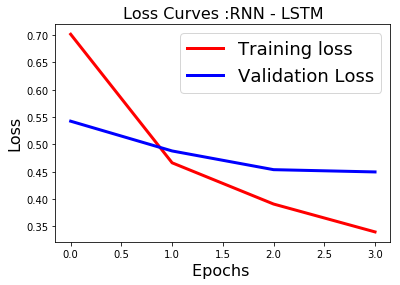

In [127]:
fig1 = plt.figure()
plt.plot(history.history['loss'],'r',linewidth=3.0)
plt.plot(history.history['val_loss'],'b',linewidth=3.0)
plt.legend(['Training loss', 'Validation Loss'],fontsize=18)
plt.xlabel('Epochs ',fontsize=16)
plt.ylabel('Loss',fontsize=16)
plt.title('Loss Curves :RNN - LSTM',fontsize=16)
plt.show()

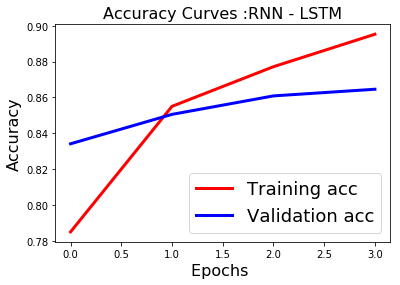

In [128]:
fig1 = plt.figure()
plt.plot(history.history['acc'],'r',linewidth=3.0)
plt.plot(history.history['val_acc'],'b',linewidth=3.0)
plt.legend(['Training acc', 'Validation acc'],fontsize=18)
plt.xlabel('Epochs ',fontsize=16)
plt.ylabel('Accuracy',fontsize=16)
plt.title('Accuracy Curves :RNN - LSTM',fontsize=16)
plt.show()

In [129]:
#predictions on test data
predicted=model.predict(test_data)
predicted

array([[5.5211189e-05, 2.5708898e-04, 2.1478408e-03, ..., 1.8038829e-05,
        3.7674804e-06, 1.1373026e-04],
       [8.6022669e-04, 6.0431822e-04, 1.3940570e-04, ..., 4.4649594e-05,
        1.0181534e-05, 6.0497725e-04],
       [5.7599227e-05, 2.3364092e-03, 1.2777522e-03, ..., 1.1214565e-04,
        6.9655430e-06, 1.4508671e-04],
       ...,
       [1.0940007e-04, 9.1092597e-04, 3.0599050e-03, ..., 8.2920502e-05,
        1.5833883e-05, 2.6201201e-04],
       [3.9502066e-03, 3.4798001e-04, 7.2150870e-05, ..., 8.3476816e-06,
        4.2925990e-06, 9.4102470e-05],
       [6.4759463e-04, 1.6792137e-03, 1.7681593e-02, ..., 8.2043895e-05,
        3.7072277e-05, 6.3564104e-04]], dtype=float32)

In [130]:
#model evaluation
import sklearn
from sklearn.metrics import precision_recall_fscore_support as score
precision, recall, fscore, support = score(labels_test, predicted.round())
print('precision: \n{}'.format(precision))
print('recall: \n{}'.format(recall))
print('fscore: \n{}'.format(fscore))
print('support: \n{}'.format(support))
print("############################")


precision: 
[0.89958159 0.83018868 0.85476956 0.89159364 0.86867994 0.74285714
 0.92566872 0.         0.76271186 0.77674419 0.88693957]
recall: 
[0.75280112 0.62173913 0.80474268 0.87707535 0.86531449 0.62650602
 0.96487936 0.         0.24725275 0.77674419 0.85526316]
fscore: 
[0.81967213 0.71100062 0.82900208 0.88427491 0.86699395 0.67973856
 0.94486742 0.         0.37344398 0.77674419 0.8708134 ]
support: 
[1428  920 1982 3132 4388  166 3730   27  182  215  532]
############################


In [131]:
from sklearn.metrics import classification_report
print(classification_report(labels_test, predicted.round(),target_names=df1['product'].unique()))

                         precision    recall  f1-score   support

        Debt collection       0.90      0.75      0.82      1428
          Consumer Loan       0.83      0.62      0.71       920
               Mortgage       0.85      0.80      0.83      1982
            Credit card       0.89      0.88      0.88      3132
       Credit reporting       0.87      0.87      0.87      4388
           Student loan       0.74      0.63      0.68       166
Bank account or service       0.93      0.96      0.94      3730
            Payday loan       0.00      0.00      0.00        27
        Money transfers       0.76      0.25      0.37       182
Other financial service       0.78      0.78      0.78       215
           Prepaid card       0.89      0.86      0.87       532

              micro avg       0.88      0.85      0.87     16702
              macro avg       0.77      0.67      0.71     16702
           weighted avg       0.88      0.85      0.86     16702
            samples avg

In [132]:
def new_predict(texts):
    _seq = tokenizer.texts_to_sequences(texts)
    _text_data = pad_sequences(
        _seq, maxlen=MAX_SEQUENCE_LENGTH, padding="post", truncating="post"
    )
    return model.predict(_text_data)

In [133]:
import lime
from lime.lime_text import LimeTextExplainer
class_names=list(df1['product'].unique())
explainer = LimeTextExplainer(class_names=class_names)
idx=54

In [134]:
exp = explainer.explain_instance(valid_x.iloc[idx], new_predict, num_features=11, top_labels=2)

In [135]:
exp.show_in_notebook(text=True)

# BERT

In [53]:
from transformers import TFBertModel,  BertConfig, BertTokenizerFast

In [54]:
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from keras.initializers import TruncatedNormal
from keras.losses import CategoricalCrossentropy
from keras.metrics import CategoricalAccuracy

In [55]:
model_name = 'bert-base-uncased'

In [56]:
max_length = 394

In [57]:
config = BertConfig.from_pretrained(model_name)
config.output_hidden_states = False

In [58]:
# Load BERT tokenizer
tokenizerbert = BertTokenizerFast.from_pretrained(pretrained_model_name_or_path = model_name, config = config)

In [59]:
# Load the Transformers BERT model
transformer_model = TFBertModel.from_pretrained(model_name, config = config)

Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [60]:
# Load the MainLayer
bert = transformer_model.layers[0]

In [61]:
# Build your model input
input_ids = Input(shape=(max_length,), name='input_ids', dtype='int32')
inputs = {'input_ids': input_ids}

In [62]:
# Load the Transformers BERT model as a layer in a Keras model
bert_model = bert(inputs)[1]
dropout = Dropout(config.hidden_dropout_prob, name='pooled_output')
pooled_output = dropout(bert_model, training=False)

In [63]:
# Then build your model output
product = Dense(units=len(df1['product'].unique()), kernel_initializer=TruncatedNormal(stddev=config.initializer_range), name='product')(pooled_output)
outputs = {'product': product}

In [64]:
model = Model(inputs=inputs, outputs=outputs, name='BERT_MultiLabel_MultiClass')

In [65]:
model.summary()

Model: "BERT_MultiLabel_MultiClass"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_ids (InputLayer)       [(None, 394)]             0         
_________________________________________________________________
bert (TFBertMainLayer)       TFBaseModelOutputWithPool 109482240 
_________________________________________________________________
pooled_output (Dropout)      (None, 768)               0         
_________________________________________________________________
product (Dense)              (None, 11)                8459      
Total params: 109,490,699
Trainable params: 109,490,699
Non-trainable params: 0
_________________________________________________________________


In [66]:
### ------- Train the model ------- ###
# Set an optimizer
optimizer = Adam(
    learning_rate=5e-05,
    epsilon=1e-08,
    decay=0.01,
    clipnorm=1.0)

In [67]:
# Set loss and metrics
loss = {'product': CategoricalCrossentropy(from_logits = True)}
metric = {'product': CategoricalAccuracy('accuracy')}

In [68]:
# Compile the model
model.compile(
    optimizer = optimizer,
    loss = loss, 
    metrics = metric)

In [ ]:
# Ready output data for the model
y_issue = to_categorical(data['Issue'])
y_product = to_categorical(data['Product'])

In [69]:
train_x.values.tolist()

['almost year ago paid group called ca almost 200000 obtain harp loan get loan gave paperwork sold green tree loan harp loan time aome 1500000 adjustment add loan 9000000 owe 10000000 house balance show 8500000 want sell house appraise 9200000 er 9000000 found extra 1500000 attached loan get answer anyone extra 1500000 thanks xxxx',
 'experian falsing report old mortgage loansmortgage account number mortgage account number started hardship process week prior closure short sale loan servicer bundled bulk saletransfer new servicer subsequently providing false misleading reason denying short sale refused handle loan modification without first making payment customer service agent suggested take loan account prove serious resolving matter loan taken payment made still unable get assistance short sale modification year later deed property transfered support history attached experian credit bureau refused correct reporting mistake complaint request attached experian list verifiedupdates inco

In [70]:
# Tokenize the input (takes some time)
x = tokenizerbert(
    text=train_x.values.tolist(),
    add_special_tokens=True,
    max_length=max_length,
    truncation=True,
    padding=True, 
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = False,
    verbose = True)

In [71]:
# Fit the model
history = model.fit(
    x={'input_ids': x['input_ids']},
    y={'product': labels_train},
    validation_split=0.2,
    batch_size=16,
    epochs=5)

Epoch 1/5
   7/2506 [..............................] - ETA: 70:22:25 - loss: 2.4033 - accuracy: 0.31 - ETA: 59:19:52 - loss: 2.3809 - accuracy: 0.28 - ETA: 70:11:33 - loss: 2.3559 - accuracy: 0.28 - ETA: 72:55:56 - loss: 2.3415 - accuracy: 0.27 - ETA: 73:54:24 - loss: 2.3299 - accuracy: 0.26 - ETA: 74:06:48 - loss: 2.3163 - accuracy: 0.25 - ETA: 74:56:32 - loss: 2.3029 - accuracy: 0.2553

KeyboardInterrupt: 

In [ ]:
test_y_issue = to_categorical(data_test['Issue'])
test_y_product = to_categorical(data_test['Product'])
test_xbert = tokenizerbert(
    text=test_x.values.tolist(),
    add_special_tokens=True,
    max_length=max_length,
    truncation=True,
    padding=True, 
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = False,
    verbose = True)

In [ ]:
# Run evaluation
model_eval = model.evaluate(
    x={'input_ids': test_xbert['input_ids']},
    y={'product': labels_test}
)